In [1]:
%matplotlib inline

import pandas as pd
from PIL import Image as pil_image
from scipy.misc import imshow, imsave

from sprite_images import load_images, images_to_sprite

image_dir = './images/'
file_name = 'amazon_products_train.csv'

In [2]:
df = pd.read_csv(file_name)

In [376]:
sample_df = df.sample(500)

In [377]:
sample_df['image_file'] = sample_df['image_file'].apply(lambda x: image_dir + x)

In [378]:
images = load_images(sample_df['image_file'].values.tolist(), 
                     dtype=np.float32, 
                     n_jobs=-1)

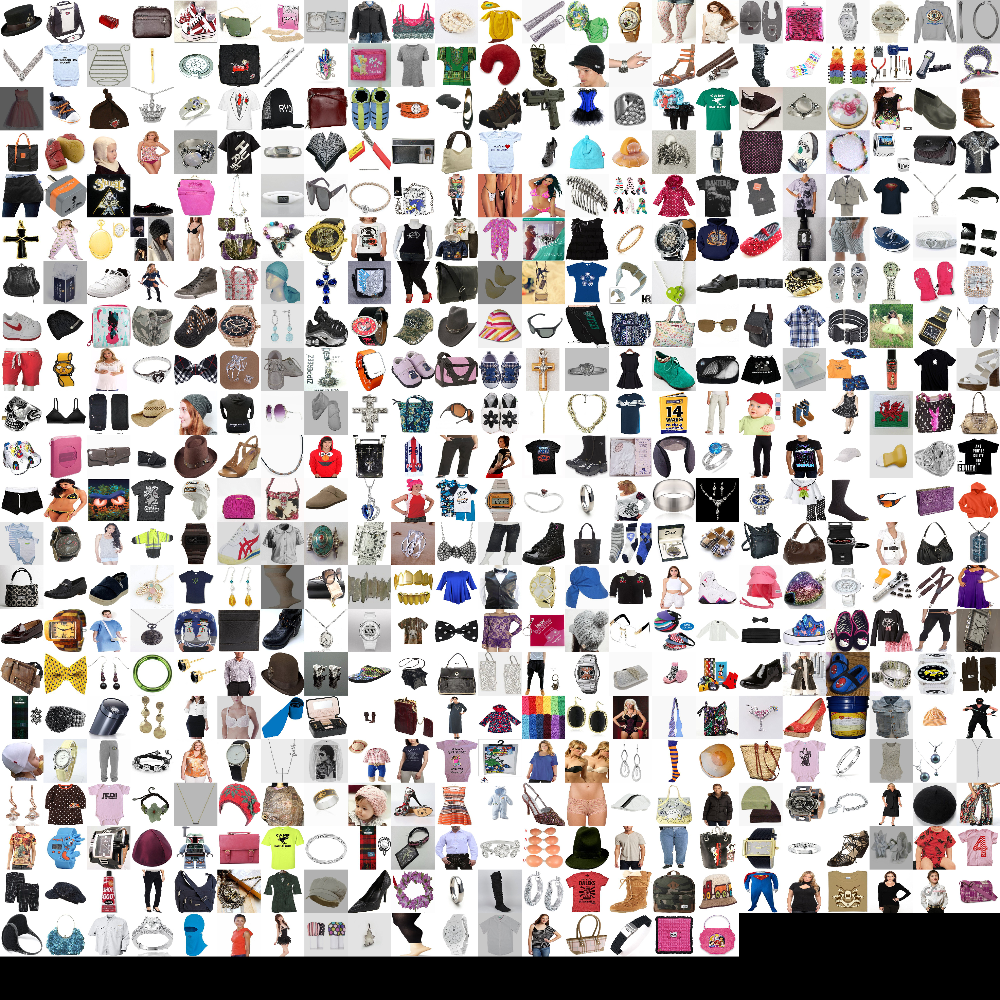

In [379]:
pil_image.fromarray(images_to_sprite(images))

In [380]:
text = sample_df['title']

In [381]:
from sklearn.feature_extraction.text import TfidfVectorizer
vec = TfidfVectorizer(ngram_range=(1,1), stop_words='english')
tfidf = vec.fit_transform(text.values.tolist())

In [382]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
svd = TruncatedSVD(n_components=2)
embedding = svd.fit_transform(tfidf)
#svd = TSNE(n_components=2, init='pca', random_state=123).fit_transform(tfidf.toarray())

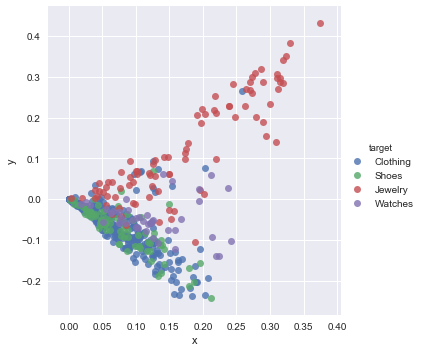

In [383]:
import seaborn as sns
svd_df = pd.DataFrame({'x': embedding[:, 0], 'y': embedding[:, 1]})
svd_df['target'] = sample_df['product_category'].values
sns.lmplot(x='x', y='y', data=svd_df, fit_reg=False, hue='target')

In [384]:
top_10 = np.argsort(svd.components_.T * np.sqrt(svd.explained_variance_), axis=0)[:30, :][::-1].T

In [385]:
feature_names = vec.get_feature_names()
for i in top_10[0, :]:
    print(feature_names[i])

foot
arch
amazing
arches
petals
ni
said
knights
pod
intrigo
page
flame
grounded
parts
india
south
africa
plug
adaptor
samsonite
choker
chip
chakra
embroidered
flag
wales
patch
creature
hedge
haunted


In [386]:
for i in top_10[1, :]:
    print(feature_names[i])

small
neck
jacket
print
newborn
flap
white
piece
handbag
dress
toddler
leather
girls
cotton
shoe
size
men
set
watch
boys
infant
bag
hat
pink
12
months
shirt
women
baby
black


In [3]:
from sklearn.preprocessing import LabelEncoder
y = df['product_category'].values
X = df['title'].values

# preprocess y
encoder = LabelEncoder()
y = encoder.fit_transform(y)

# preprocess X
from sklearn.feature_extraction.text import TfidfVectorizer
vec = TfidfVectorizer(ngram_range=(1,1), stop_words='english')
tfidf = vec.fit_transform(X.tolist())

# model
from sklearn.svm import LinearSVC
svc = LinearSVC(random_state=123)
svc.fit(tfidf, y)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=123, tol=0.0001,
     verbose=0)

In [4]:
dev_df = pd.read_csv('amazon_products_dev.csv')

X_dev = dev_df['title'].values
y_dev = dev_df['product_category'].values

y_dev = encoder.transform(y_dev)
X_dev = vec.transform(X_dev.tolist())

y_pred = svc.predict(X_dev)

In [5]:
from sklearn.metrics import accuracy_score
np.where(y_pred != y_dev)

(array([   3,   11,   17,   21,   80,  101,  106,  124,  128,  130,  142,
         144,  148,  172,  177,  186,  193,  199,  213,  218,  220,  238,
         243,  249,  256,  263,  282,  287,  302,  328,  358,  359,  362,
         377,  401,  453,  469,  472,  499,  515,  532,  540,  580,  608,
         610,  615,  623,  647,  654,  658,  673,  706,  707,  723,  732,
         740,  746,  758,  766,  772,  778,  821,  836,  846,  869,  905,
         908,  913,  918,  920,  935,  947,  951,  960,  969,  974,  987,
         991, 1004, 1009, 1017, 1032, 1034, 1052, 1054, 1070, 1089, 1096,
        1102, 1107, 1125, 1128, 1129, 1134, 1143, 1148, 1152, 1153, 1168,
        1178, 1179, 1183, 1200, 1202, 1209, 1218, 1236, 1255, 1261, 1269,
        1272, 1283, 1284, 1287, 1302, 1307, 1318, 1319, 1326, 1335, 1350,
        1352, 1372, 1388, 1400, 1403, 1406, 1416, 1424, 1443, 1445, 1455,
        1461, 1494, 1507, 1518, 1534, 1536, 1547, 1566, 1568, 1582, 1624,
        1635, 1649, 1704, 1713, 1734, 

In [6]:
row = dev_df.iloc[913]
image_file = row['image_file']
row

title               Aigle Equibelle Size 39
image_file                   B003P8QEPY.jpg
product_category                      Shoes
Name: 913, dtype: object

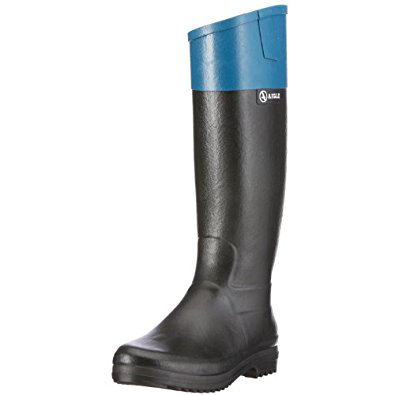

In [7]:
from sprite_images import load_image
im=pil_image.fromarray(np.squeeze(load_image(image_dir + image_file)))
im

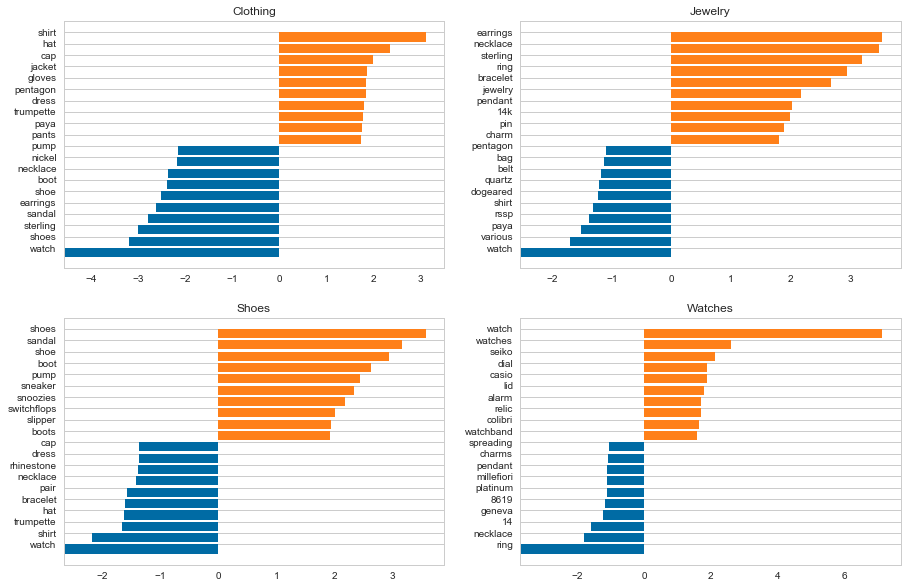

In [8]:
from model_utils import feature_coefficients
ax = feature_coefficients(svc, vec.get_feature_names(), class_names=encoder.classes_, n_features=10, figsize=(15,10))